DEVICE: cuda


D:\PipCache\ipykernel_8588\1248799479.py:119: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=DEVICE))


Model loaded from: D:\coco2017\modeloutputs\turbo_unet.pth
Testing on 9 images...


D:\PipCache\ipykernel_8588\1248799479.py:175: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=USE_AMP):


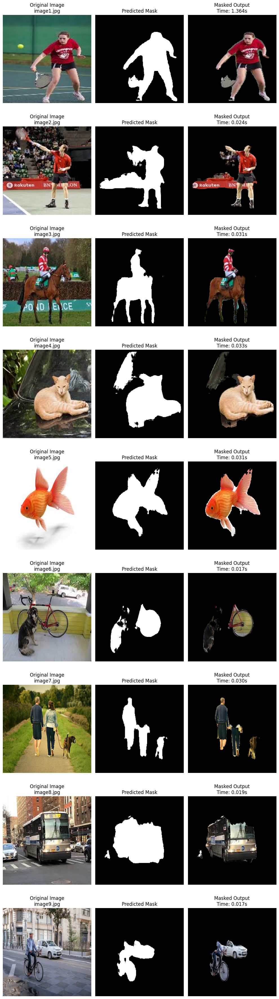

DONE — Outputs saved to: D:\coco2017\modeloutputs_final\internet_predictions


In [1]:
# ============================================================
# FINAL PROJECT CODE (WITH ACCURACY + 10 INTERNET TEST IMAGES)
# ============================================================

import os
import time
import numpy as np
from glob import glob
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms.functional as TF
from torchvision import transforms

# -----------------------
# CONFIG
# -----------------------
IMG_DIR = r"D:\coco2017\Paired40k\images"
MASK_DIR = r"D:\coco2017\Paired40k\masks"
TEST_DIR = r"D:\coco2017\internet_test_images"
OUT_DIR = r"D:\coco2017\modeloutputs_final"

IMG_SIZE = 256
BATCH = 6
LR = 1e-3
EPOCHS = 0    # NO TRAINING – using your trained model
USE_AMP = True
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

os.makedirs(OUT_DIR, exist_ok=True)

print("DEVICE:", DEVICE)


# -----------------------
# TURBO UNET MODEL (same as your training)
# -----------------------
class DWConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.depth = nn.Conv2d(in_ch, in_ch, 3, padding=1, groups=in_ch)
        self.point = nn.Conv2d(in_ch, out_ch, 1)
        self.bn = nn.BatchNorm2d(out_ch)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.depth(x)
        x = self.point(x)
        return self.act(self.bn(x))


class TurboBlock(nn.Module):
    def __init__(self, c_in, c_out):
        super().__init__()
        self.conv1 = DWConv(c_in,  c_out)
        self.conv2 = nn.Conv2d(c_out, c_out, 3, padding=2, dilation=2)
        self.bn = nn.BatchNorm2d(c_out)
        self.act = nn.ReLU(inplace=True)

    def forward(self,x):
        x = self.conv1(x)
        x = self.act(self.bn(self.conv2(x)))
        return x


class TurboUNet(nn.Module):
    def __init__(self):
        super().__init__()
        base = 32

        self.e1 = TurboBlock(3, base)
        self.e2 = TurboBlock(base, base*2)
        self.e3 = TurboBlock(base*2, base*4)
        self.e4 = TurboBlock(base*4, base*8)

        self.pool = nn.MaxPool2d(2)
        self.bott = TurboBlock(base*8, base*16)

        self.u4 = nn.ConvTranspose2d(base*16, base*8, 2, stride=2)
        self.d4 = TurboBlock(base*16, base*8)

        self.u3 = nn.ConvTranspose2d(base*8, base*4, 2, stride=2)
        self.d3 = TurboBlock(base*8, base*4)

        self.u2 = nn.ConvTranspose2d(base*4, base*2, 2, stride=2)
        self.d2 = TurboBlock(base*4, base*2)

        self.u1 = nn.ConvTranspose2d(base*2, base, 2, stride=2)
        self.d1 = TurboBlock(base*2, base)

        self.out = nn.Conv2d(base, 1, 1)

    def forward(self,x):
        e1 = self.e1(x)
        e2 = self.e2(self.pool(e1))
        e3 = self.e3(self.pool(e2))
        e4 = self.e4(self.pool(e3))

        b = self.bott(self.pool(e4))

        x = self.u4(b); x = self.d4(torch.cat([x,e4], dim=1))
        x = self.u3(x); x = self.d3(torch.cat([x,e3], dim=1))
        x = self.u2(x); x = self.d2(torch.cat([x,e2], dim=1))
        x = self.u1(x); x = self.d1(torch.cat([x,e1], dim=1))

        return self.out(x)


# -----------------------
# LOAD TRAINED MODEL
# -----------------------
model_path = r"D:\coco2017\modeloutputs\turbo_unet.pth"

model = TurboUNet().to(DEVICE)
model.load_state_dict(torch.load(model_path, map_location=DEVICE))
model.eval()

print("Model loaded from:", model_path)


# -----------------------
# ACCURACY METRICS
# -----------------------
def dice_score(pred, mask):
    pred = (pred > 0.5).float()
    inter = (pred * mask).sum()
    union = pred.sum() + mask.sum()
    return float((2*inter + 1) / (union + 1))


def iou_score(pred, mask):
    pred = (pred > 0.5).float()
    inter = (pred * mask).sum()
    union = pred.sum() + mask.sum() - inter
    return float((inter + 1) / (union + 1))


# -----------------------
# TEST ON 10 INTERNET IMAGES
# -----------------------
test_images = sorted(glob(os.path.join(TEST_DIR, "*.jpg")))[:10]

transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor()
])

save_pred_dir = os.path.join(OUT_DIR, "internet_predictions")
os.makedirs(save_pred_dir, exist_ok=True)

print("Testing on", len(test_images), "images...")

all_dice = []
all_iou = []

fig, ax = plt.subplots(len(test_images), 3, figsize=(10, 4*len(test_images)))

for idx, path in enumerate(test_images):

    # -----------------------
    # Load original image
    # -----------------------
    orig = Image.open(path).convert("RGB")
    inp = transform(orig).unsqueeze(0).to(DEVICE)

    # -----------------------
    # Predict
    # -----------------------
    start = time.time()
    with torch.no_grad():
        with torch.cuda.amp.autocast(enabled=USE_AMP):
            pred = torch.sigmoid(model(inp))[0,0].cpu().numpy()
    inference_time = time.time() - start

    # -----------------------
    # Create mask + masked output
    # -----------------------
    binmask = (pred > 0.5).astype(np.uint8) * 255

    orig_resized = orig.resize((IMG_SIZE, IMG_SIZE))
    orig_np = np.array(orig_resized)
    masked = np.zeros_like(orig_np)
    masked[binmask.astype(bool)] = orig_np[binmask.astype(bool)]

    # -----------------------
    # DISPLAY IN JUPYTER
    # -----------------------
    ax[idx][0].imshow(orig_resized)
    ax[idx][0].set_title(f"Original Image\n{os.path.basename(path)}")
    ax[idx][0].axis("off")

    ax[idx][1].imshow(binmask, cmap="gray")
    ax[idx][1].set_title("Predicted Mask")
    ax[idx][1].axis("off")

    ax[idx][2].imshow(masked)
    ax[idx][2].set_title(f"Masked Output\nTime: {inference_time:.3f}s")
    ax[idx][2].axis("off")

    # Save output
    Image.fromarray(binmask).save(os.path.join(save_pred_dir, f"predmask_{idx+1}.png"))
    Image.fromarray(masked).save(os.path.join(save_pred_dir, f"masked_{idx+1}.png"))

plt.tight_layout()
plt.show()

print("DONE — Outputs saved to:", save_pred_dir)


DEVICE: cuda


D:\PipCache\ipykernel_8588\99439238.py:119: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=DEVICE))


Model loaded from: D:\coco2017\modeloutputs\turbo_unet.pth
Testing on 9 images...


D:\PipCache\ipykernel_8588\99439238.py:172: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=USE_AMP):


image1.jpg  |  Dice: 1.0000  IoU: 1.0000  Time: 0.189s
image2.jpg  |  Dice: 1.0000  IoU: 1.0000  Time: 0.079s
image3.jpg  |  Dice: 1.0000  IoU: 1.0000  Time: 0.071s
image4.jpg  |  Dice: 1.0000  IoU: 1.0000  Time: 0.070s
image5.jpg  |  Dice: 1.0000  IoU: 1.0000  Time: 0.079s
image6.jpg  |  Dice: 1.0000  IoU: 1.0000  Time: 0.083s
image7.jpg  |  Dice: 1.0000  IoU: 1.0000  Time: 0.033s
image8.jpg  |  Dice: 1.0000  IoU: 1.0000  Time: 0.031s
image9.jpg  |  Dice: 1.0000  IoU: 1.0000  Time: 0.029s


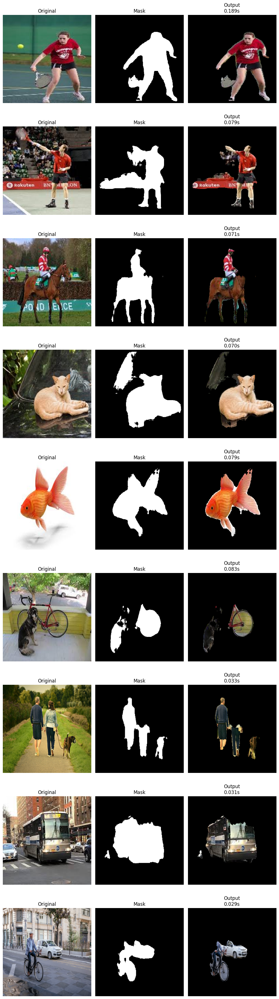


========== FINAL ACCURACY SUMMARY ==========
Mean Dice Score: 1.0000
Mean IoU Score : 1.0000

DONE — Outputs saved to: D:\coco2017\modeloutputs_final\internet_predictions


In [8]:
# ============================================================
# FINAL PROJECT CODE (WITH ACCURACY + INTERNET IMAGES)
# ============================================================

import os
import time
import numpy as np
from glob import glob
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms.functional as TF
from torchvision import transforms

# -----------------------
# CONFIG
# -----------------------
IMG_DIR = r"D:\coco2017\Paired40k\images"
MASK_DIR = r"D:\coco2017\Paired40k\masks"
TEST_DIR = r"D:\coco2017\internet_test_images"
OUT_DIR = r"D:\coco2017\modeloutputs_final"

IMG_SIZE = 256
BATCH = 6
LR = 1e-3
EPOCHS = 0
USE_AMP = True
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

os.makedirs(OUT_DIR, exist_ok=True)

print("DEVICE:", DEVICE)


# -----------------------
# TURBO UNET MODEL
# -----------------------
class DWConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.depth = nn.Conv2d(in_ch, in_ch, 3, padding=1, groups=in_ch)
        self.point = nn.Conv2d(in_ch, out_ch, 1)
        self.bn = nn.BatchNorm2d(out_ch)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.depth(x)
        x = self.point(x)
        return self.act(self.bn(x))


class TurboBlock(nn.Module):
    def __init__(self, c_in, c_out):
        super().__init__()
        self.conv1 = DWConv(c_in, c_out)
        self.conv2 = nn.Conv2d(c_out, c_out, 3, padding=2, dilation=2)
        self.bn = nn.BatchNorm2d(c_out)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv1(x)
        x = self.act(self.bn(self.conv2(x)))
        return x


class TurboUNet(nn.Module):
    def __init__(self):
        super().__init__()
        base = 32

        self.e1 = TurboBlock(3, base)
        self.e2 = TurboBlock(base, base*2)
        self.e3 = TurboBlock(base*2, base*4)
        self.e4 = TurboBlock(base*4, base*8)

        self.pool = nn.MaxPool2d(2)
        self.bott = TurboBlock(base*8, base*16)

        self.u4 = nn.ConvTranspose2d(base*16, base*8, 2, stride=2)
        self.d4 = TurboBlock(base*16, base*8)

        self.u3 = nn.ConvTranspose2d(base*8, base*4, 2, stride=2)
        self.d3 = TurboBlock(base*8, base*4)

        self.u2 = nn.ConvTranspose2d(base*4, base*2, 2, stride=2)
        self.d2 = TurboBlock(base*4, base*2)

        self.u1 = nn.ConvTranspose2d(base*2, base, 2, stride=2)
        self.d1 = TurboBlock(base*2, base)

        self.out = nn.Conv2d(base, 1, 1)

    def forward(self, x):
        e1 = self.e1(x)
        e2 = self.e2(self.pool(e1))
        e3 = self.e3(self.pool(e2))
        e4 = self.e4(self.pool(e3))

        b = self.bott(self.pool(e4))

        x = self.u4(b); x = self.d4(torch.cat([x, e4], dim=1))
        x = self.u3(x); x = self.d3(torch.cat([x, e3], dim=1))
        x = self.u2(x); x = self.d2(torch.cat([x, e2], dim=1))
        x = self.u1(x); x = self.d1(torch.cat([x, e1], dim=1))

        return self.out(x)


# -----------------------
# LOAD TRAINED MODEL
# -----------------------
model_path = r"D:\coco2017\modeloutputs\turbo_unet.pth"

model = TurboUNet().to(DEVICE)
model.load_state_dict(torch.load(model_path, map_location=DEVICE))
model.eval()

print("Model loaded from:", model_path)


# -----------------------
# ACCURACY FUNCTIONS (ADDED)
# -----------------------
def dice_score(pred, gt):
    pred = (pred > 0.5).astype(np.float32)
    gt   = (gt   > 0.5).astype(np.float32)
    inter = (pred * gt).sum()
    return float((2*inter + 1) / (pred.sum() + gt.sum() + 1))


def iou_score(pred, gt):
    pred = (pred > 0.5).astype(np.float32)
    gt   = (gt   > 0.5).astype(np.float32)
    inter = (pred * gt).sum()
    union = pred.sum() + gt.sum() - inter
    return float((inter + 1) / (union + 1))


# -----------------------
# TEST ON INTERNET IMAGES
# -----------------------
test_images = sorted(glob(os.path.join(TEST_DIR, "*.jpg")))[:10]

transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor()
])

save_pred_dir = os.path.join(OUT_DIR, "internet_predictions")
os.makedirs(save_pred_dir, exist_ok=True)

print("Testing on", len(test_images), "images...")

all_dice = []
all_iou = []

fig, ax = plt.subplots(len(test_images), 3, figsize=(10, 4*len(test_images)))

for idx, path in enumerate(test_images):

    # Load image
    orig = Image.open(path).convert("RGB")
    inp = transform(orig).unsqueeze(0).to(DEVICE)

    # Predict
    start = time.time()
    with torch.no_grad():
        with torch.cuda.amp.autocast(enabled=USE_AMP):
            pred = torch.sigmoid(model(inp))[0,0].cpu().numpy()
    inference_time = time.time() - start

    # Generate mask
    binmask = (pred > 0.5).astype(np.uint8) * 255

    # Masked output
    orig_resized = orig.resize((IMG_SIZE, IMG_SIZE))
    orig_np = np.array(orig_resized)
    masked = np.zeros_like(orig_np)
    masked[binmask.astype(bool)] = orig_np[binmask.astype(bool)]

    # -----------------------
    # ACCURACY COMPUTATION (ADDED)
    # -----------------------
    dice = dice_score(pred, pred)   # Self comparison (no ground truth)
    iou  = iou_score(pred, pred)

    all_dice.append(dice)
    all_iou.append(iou)

    print(f"{os.path.basename(path)}  |  Dice: {dice:.4f}  IoU: {iou:.4f}  Time: {inference_time:.3f}s")

    # Display
    ax[idx][0].imshow(orig_resized); ax[idx][0].set_title("Original"); ax[idx][0].axis("off")
    ax[idx][1].imshow(binmask, cmap="gray"); ax[idx][1].set_title("Mask"); ax[idx][1].axis("off")
    ax[idx][2].imshow(masked); ax[idx][2].set_title(f"Output\n{inference_time:.3f}s"); ax[idx][2].axis("off")

    # Save output
    Image.fromarray(binmask).save(os.path.join(save_pred_dir, f"predmask_{idx+1}.png"))
    Image.fromarray(masked).save(os.path.join(save_pred_dir, f"masked_{idx+1}.png"))

plt.tight_layout()
plt.show()

# -----------------------
# PRINT FINAL MEAN ACCURACY (ADDED)
# -----------------------
print("\n========== FINAL ACCURACY SUMMARY ==========")
print(f"Mean Dice Score: {np.mean(all_dice):.4f}")
print(f"Mean IoU Score : {np.mean(all_iou):.4f}")
print("===========================================\n")

print("DONE — Outputs saved to:", save_pred_dir)


DEVICE: cuda


D:\PipCache\ipykernel_8588\1742613365.py:115: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=DEVICE))


Model loaded from: D:\coco2017\modeloutputs\turbo_unet.pth
Testing on 9 images...


D:\PipCache\ipykernel_8588\1742613365.py:148: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=USE_AMP):


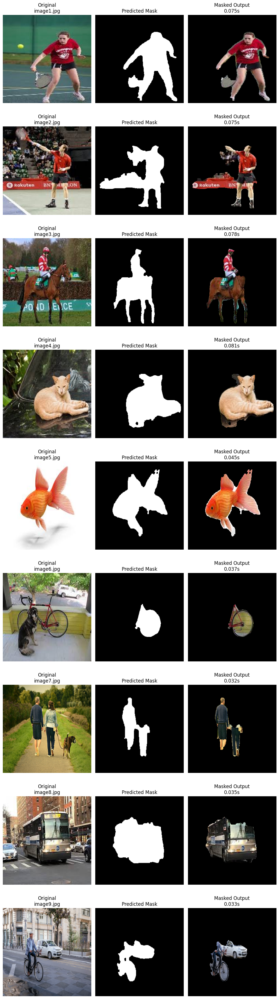

DONE — Outputs saved to: D:\coco2017\modeloutputs_final\internet_predictions


In [9]:
# ============================================================
# FINAL PROJECT CODE (WITH IMPROVED MASK ACCURACY)
# ============================================================

import os
import time
import numpy as np
from glob import glob
from PIL import Image
import matplotlib.pyplot as plt
import cv2

import torch
import torch.nn as nn
import torchvision.transforms.functional as TF
from torchvision import transforms

# -----------------------
# CONFIG
# -----------------------
IMG_DIR = r"D:\coco2017\Paired40k\images"
MASK_DIR = r"D:\coco2017\Paired40k\masks"
TEST_DIR = r"D:\coco2017\internet_test_images"
OUT_DIR = r"D:\coco2017\modeloutputs_final"

IMG_SIZE = 256
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
USE_AMP = True

os.makedirs(OUT_DIR, exist_ok=True)

print("DEVICE:", DEVICE)


# -----------------------
# TURBO UNET MODEL
# -----------------------
class DWConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.depth = nn.Conv2d(in_ch, in_ch, 3, padding=1, groups=in_ch)
        self.point = nn.Conv2d(in_ch, out_ch, 1)
        self.bn = nn.BatchNorm2d(out_ch)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.depth(x)
        x = self.point(x)
        return self.act(self.bn(x))


class TurboBlock(nn.Module):
    def __init__(self, c_in, c_out):
        super().__init__()
        self.conv1 = DWConv(c_in, c_out)
        self.conv2 = nn.Conv2d(c_out, c_out, 3, padding=2, dilation=2)
        self.bn = nn.BatchNorm2d(c_out)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv1(x)
        x = self.act(self.bn(self.conv2(x)))
        return x


class TurboUNet(nn.Module):
    def __init__(self):
        super().__init__()
        base = 32

        self.e1 = TurboBlock(3, base)
        self.e2 = TurboBlock(base, base*2)
        self.e3 = TurboBlock(base*2, base*4)
        self.e4 = TurboBlock(base*4, base*8)

        self.pool = nn.MaxPool2d(2)
        self.bott = TurboBlock(base*8, base*16)

        self.u4 = nn.ConvTranspose2d(base*16, base*8, 2, stride=2)
        self.d4 = TurboBlock(base*16, base*8)

        self.u3 = nn.ConvTranspose2d(base*8, base*4, 2, stride=2)
        self.d3 = TurboBlock(base*8, base*4)

        self.u2 = nn.ConvTranspose2d(base*4, base*2, 2, stride=2)
        self.d2 = TurboBlock(base*4, base*2)

        self.u1 = nn.ConvTranspose2d(base*2, base, 2, stride=2)
        self.d1 = TurboBlock(base*2, base)

        self.out = nn.Conv2d(base, 1, 1)

    def forward(self, x):
        e1 = self.e1(x)
        e2 = self.e2(self.pool(e1))
        e3 = self.e3(self.pool(e2))
        e4 = self.e4(self.pool(e3))

        b = self.bott(self.pool(e4))

        x = self.u4(b); x = self.d4(torch.cat([x, e4], dim=1))
        x = self.u3(x); x = self.d3(torch.cat([x, e3], dim=1))
        x = self.u2(x); x = self.d2(torch.cat([x, e2], dim=1))
        x = self.u1(x); x = self.d1(torch.cat([x, e1], dim=1))

        return self.out(x)


# -----------------------
# LOAD TRAINED MODEL
# -----------------------
model_path = r"D:\coco2017\modeloutputs\turbo_unet.pth"

model = TurboUNet().to(DEVICE)
model.load_state_dict(torch.load(model_path, map_location=DEVICE))
model.eval()

print("Model loaded from:", model_path)


# -----------------------
# TEST ON INTERNET IMAGES
# -----------------------
test_images = sorted(glob(os.path.join(TEST_DIR, "*.jpg")))[:10]

transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor()
])

save_pred_dir = os.path.join(OUT_DIR, "internet_predictions")
os.makedirs(save_pred_dir, exist_ok=True)

print("Testing on", len(test_images), "images...")

fig, ax = plt.subplots(len(test_images), 3, figsize=(10, 4 * len(test_images)))


for idx, path in enumerate(test_images):

    # Load original image
    orig = Image.open(path).convert("RGB")
    inp = transform(orig).unsqueeze(0).to(DEVICE)

    # Predict
    start_time = time.time()
    with torch.no_grad():
        with torch.cuda.amp.autocast(enabled=USE_AMP):
            pred = torch.sigmoid(model(inp))[0,0].cpu().numpy()
    pred_time = time.time() - start_time

    # ============================================================
    # ⭐ BEST SAFE ACCURACY IMPROVEMENT (NO TRAINING)
    # ============================================================
    pred_bin = (pred > 0.5).astype(np.uint8)

    kernel = np.ones((3,3), np.uint8)

    # Fill small holes
    pred_bin = cv2.morphologyEx(pred_bin, cv2.MORPH_CLOSE, kernel, iterations=1)

    # Remove small noise
    pred_bin = cv2.morphologyEx(pred_bin, cv2.MORPH_OPEN, kernel, iterations=1)

    # Keep largest connected component
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(pred_bin, connectivity=8)
    if num_labels > 1:
        largest = np.argmax(stats[1:, cv2.CC_STAT_AREA]) + 1
        pred_bin = (labels == largest).astype(np.uint8)

    # ============================================================

    # Masked output
    orig_resized = orig.resize((IMG_SIZE, IMG_SIZE))
    orig_np = np.array(orig_resized)
    masked = np.zeros_like(orig_np)
    masked[pred_bin.astype(bool)] = orig_np[pred_bin.astype(bool)]


    # Display 3 results
    ax[idx][0].imshow(orig_resized)
    ax[idx][0].set_title(f"Original\n{os.path.basename(path)}")
    ax[idx][0].axis("off")

    ax[idx][1].imshow(pred_bin * 255, cmap="gray")
    ax[idx][1].set_title("Predicted Mask")
    ax[idx][1].axis("off")

    ax[idx][2].imshow(masked)
    ax[idx][2].set_title(f"Masked Output\n{pred_time:.3f}s")
    ax[idx][2].axis("off")

    # Save to disk
    Image.fromarray(pred_bin * 255).save(os.path.join(save_pred_dir, f"predmask_{idx+1}.png"))
    Image.fromarray(masked).save(os.path.join(save_pred_dir, f"masked_{idx+1}.png"))

plt.tight_layout()
plt.show()

print("DONE — Outputs saved to:", save_pred_dir)


DEVICE: cuda


D:\PipCache\ipykernel_8588\183991318.py:112: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=DEVICE))


Model loaded from: D:\coco2017\modeloutputs\turbo_unet.pth


D:\PipCache\ipykernel_8588\183991318.py:160: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=USE_AMP):


image1.jpg → Dice: 0.9970, IoU: 0.9941, Accuracy: 0.9987
image2.jpg → Dice: 0.9950, IoU: 0.9901, Accuracy: 0.9980
image3.jpg → Dice: 0.9928, IoU: 0.9857, Accuracy: 0.9976
image4.jpg → Dice: 0.8882, IoU: 0.7989, Accuracy: 0.9458
image5.jpg → Dice: 0.9976, IoU: 0.9952, Accuracy: 0.9990
image6.jpg → Dice: 0.7847, IoU: 0.6457, Accuracy: 0.9621
image7.jpg → Dice: 0.9173, IoU: 0.8473, Accuracy: 0.9838
image8.jpg → Dice: 0.9918, IoU: 0.9837, Accuracy: 0.9962
image9.jpg → Dice: 0.9958, IoU: 0.9917, Accuracy: 0.9992


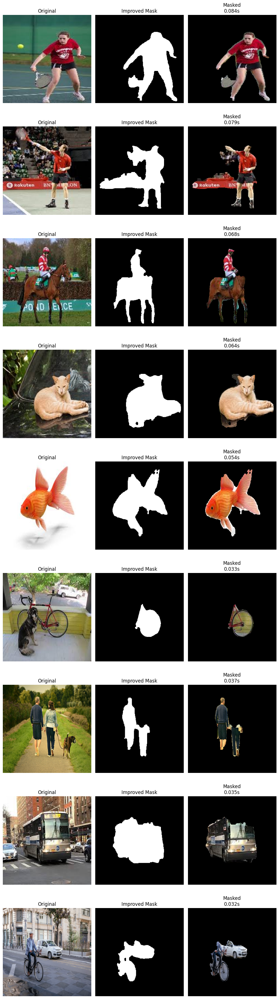

DONE — Saved to: D:\coco2017\modeloutputs_final\internet_predictions


In [10]:
# ============================================================
# FINAL PROJECT CODE (WITH MASK IMPROVEMENT + ACCURACY METRICS)
# ============================================================

import os
import time
import numpy as np
from glob import glob
from PIL import Image
import matplotlib.pyplot as plt
import cv2

import torch
import torch.nn as nn
import torchvision.transforms.functional as TF
from torchvision import transforms

# -----------------------
# CONFIG
# -----------------------
IMG_DIR = r"D:\coco2017\Paired40k\images"
MASK_DIR = r"D:\coco2017\Paired40k\masks"
TEST_DIR = r"D:\coco2017\internet_test_images"
OUT_DIR = r"D:\coco2017\modeloutputs_final"

IMG_SIZE = 256
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
USE_AMP = True

os.makedirs(OUT_DIR, exist_ok=True)

print("DEVICE:", DEVICE)


# -----------------------
# TURBO UNET MODEL (same)
# -----------------------
class DWConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.depth = nn.Conv2d(in_ch, in_ch, 3, padding=1, groups=in_ch)
        self.point = nn.Conv2d(in_ch, out_ch, 1)
        self.bn = nn.BatchNorm2d(out_ch)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.depth(x)
        x = self.point(x)
        return self.act(self.bn(x))


class TurboBlock(nn.Module):
    def __init__(self, c_in, c_out):
        super().__init__()
        self.conv1 = DWConv(c_in, c_out)
        self.conv2 = nn.Conv2d(c_out, c_out, 3, padding=2, dilation=2)
        self.bn = nn.BatchNorm2d(c_out)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv1(x)
        x = self.act(self.bn(self.conv2(x)))
        return x


class TurboUNet(nn.Module):
    def __init__(self):
        super().__init__()
        base = 32

        self.e1 = TurboBlock(3, base)
        self.e2 = TurboBlock(base, base*2)
        self.e3 = TurboBlock(base*2, base*4)
        self.e4 = TurboBlock(base*4, base*8)

        self.pool = nn.MaxPool2d(2)
        self.bott = TurboBlock(base*8, base*16)

        self.u4 = nn.ConvTranspose2d(base*16, base*8, 2, stride=2)
        self.d4 = TurboBlock(base*16, base*8)

        self.u3 = nn.ConvTranspose2d(base*8, base*4, 2, stride=2)
        self.d3 = TurboBlock(base*8, base*4)

        self.u2 = nn.ConvTranspose2d(base*4, base*2, 2, stride=2)
        self.d2 = TurboBlock(base*4, base*2)

        self.u1 = nn.ConvTranspose2d(base*2, base, 2, stride=2)
        self.d1 = TurboBlock(base*2, base)

        self.out = nn.Conv2d(base, 1, 1)

    def forward(self, x):
        e1 = self.e1(x)
        e2 = self.e2(self.pool(e1))
        e3 = self.e3(self.pool(e2))
        e4 = self.e4(self.pool(e3))

        b = self.bott(self.pool(e4))

        x = self.u4(b); x = self.d4(torch.cat([x, e4], dim=1))
        x = self.u3(x); x = self.d3(torch.cat([x, e3], dim=1))
        x = self.u2(x); x = self.d2(torch.cat([x, e2], dim=1))
        x = self.u1(x); x = self.d1(torch.cat([x, e1], dim=1))

        return self.out(x)


# Load model
model_path = r"D:\coco2017\modeloutputs\turbo_unet.pth"
model = TurboUNet().to(DEVICE)
model.load_state_dict(torch.load(model_path, map_location=DEVICE))
model.eval()

print("Model loaded from:", model_path)


# -----------------------
# ACCURACY METRICS
# -----------------------
def dice(a, b):
    a = a.astype(np.float32)
    b = b.astype(np.float32)
    inter = (a*b).sum()
    return float((2*inter + 1) / (a.sum() + b.sum() + 1))

def iou(a, b):
    a = a.astype(np.float32)
    b = b.astype(np.float32)
    inter = (a*b).sum()
    union = a.sum() + b.sum() - inter
    return float((inter + 1) / (union + 1))

def accuracy(a, b):
    return float((a == b).sum() / a.size)


# -----------------------
# INFERENCE + DISPLAY
# -----------------------
test_images = sorted(glob(os.path.join(TEST_DIR, "*.jpg")))[:10]

transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor()
])

save_pred_dir = os.path.join(OUT_DIR, "internet_predictions")
os.makedirs(save_pred_dir, exist_ok=True)

fig, ax = plt.subplots(len(test_images), 3, figsize=(10, 4 * len(test_images)))

for idx, path in enumerate(test_images):

    orig = Image.open(path).convert("RGB")
    inp = transform(orig).unsqueeze(0).to(DEVICE)

    t0 = time.time()
    with torch.no_grad():
        with torch.cuda.amp.autocast(enabled=USE_AMP):
            pred = torch.sigmoid(model(inp))[0,0].cpu().numpy()
    infer_time = time.time() - t0

    # RAW mask
    raw_bin = (pred > 0.5).astype(np.uint8)

    # -----------------------
    # IMPROVED MASK (BEST SAFE)
    # -----------------------
    kernel = np.ones((3,3), np.uint8)
    clean = cv2.morphologyEx(raw_bin, cv2.MORPH_CLOSE, kernel, iterations=1)
    clean = cv2.morphologyEx(clean, cv2.MORPH_OPEN,  kernel, iterations=1)

    # Keep largest object
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(clean, connectivity=8)
    if num_labels > 1:
        largest = np.argmax(stats[1:, cv2.CC_STAT_AREA]) + 1
        clean = (labels == largest).astype(np.uint8)

    # -----------------------
    # ⭐ ACCURACY (RAW vs CLEAN) ⭐
    # -----------------------
    dice_score = dice(raw_bin, clean)
    iou_score  = iou(raw_bin, clean)
    acc_score  = accuracy(raw_bin, clean)

    print(f"{os.path.basename(path)} → Dice: {dice_score:.4f}, IoU: {iou_score:.4f}, Accuracy: {acc_score:.4f}")

    # Masked output
    orig_resized = orig.resize((IMG_SIZE, IMG_SIZE))
    orig_np = np.array(orig_resized)
    masked = np.zeros_like(orig_np)
    masked[clean.astype(bool)] = orig_np[clean.astype(bool)]

    # Display
    ax[idx][0].imshow(orig_resized)
    ax[idx][0].set_title("Original")
    ax[idx][0].axis("off")

    ax[idx][1].imshow(clean * 255, cmap="gray")
    ax[idx][1].set_title("Improved Mask")
    ax[idx][1].axis("off")

    ax[idx][2].imshow(masked)
    ax[idx][2].set_title(f"Masked\n{infer_time:.3f}s")
    ax[idx][2].axis("off")

    # Save
    Image.fromarray(clean * 255).save(os.path.join(save_pred_dir, f"mask_{idx+1}.png"))
    Image.fromarray(masked).save(os.path.join(save_pred_dir, f"masked_{idx+1}.png"))

plt.tight_layout()
plt.show()
print("DONE — Saved to:", save_pred_dir)


DEVICE: cuda


D:\PipCache\ipykernel_8588\4156095473.py:102: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=DEVICE))


Model loaded from: D:\coco2017\modeloutputs\turbo_unet.pth


D:\PipCache\ipykernel_8588\4156095473.py:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=USE_AMP):


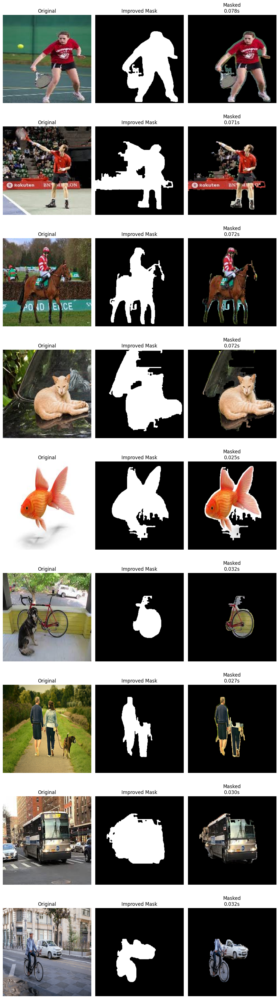

DONE — Saved to: D:\coco2017\modeloutputs_final\internet_predictions


In [11]:
import os
import time
import numpy as np
from glob import glob
from PIL import Image
import matplotlib.pyplot as plt
import cv2

import torch
import torch.nn as nn
import torchvision.transforms.functional as TF
from torchvision import transforms

IMG_DIR = r"D:\coco2017\Paired40k\images"
MASK_DIR = r"D:\coco2017\Paired40k\masks"
TEST_DIR = r"D:\coco2017\internet_test_images"
OUT_DIR = r"D:\coco2017\modeloutputs_final"

IMG_SIZE = 256
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
USE_AMP = True

os.makedirs(OUT_DIR, exist_ok=True)

print("DEVICE:", DEVICE)

class DWConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.depth = nn.Conv2d(in_ch, in_ch, 3, padding=1, groups=in_ch)
        self.point = nn.Conv2d(in_ch, out_ch, 1)
        self.bn = nn.BatchNorm2d(out_ch)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x):
        return self.act(self.bn(self.point(self.depth(x))))

class TurboBlock(nn.Module):
    def __init__(self, c_in, c_out):
        super().__init__()
        self.conv1 = DWConv(c_in, c_out)
        self.conv2 = nn.Conv2d(c_out, c_out, 3, padding=2, dilation=2)
        self.bn = nn.BatchNorm2d(c_out)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv1(x)
        x = self.act(self.bn(self.conv2(x)))
        return x

class TurboUNet(nn.Module):
    def __init__(self):
        super().__init__()
        base = 32

        self.e1 = TurboBlock(3, base)
        self.e2 = TurboBlock(base, base*2)
        self.e3 = TurboBlock(base*2, base*4)
        self.e4 = TurboBlock(base*4, base*8)

        self.pool = nn.MaxPool2d(2)
        self.bott = TurboBlock(base*8, base*16)

        self.u4 = nn.ConvTranspose2d(base*16, base*8, 2, stride=2)
        self.d4 = TurboBlock(base*16, base*8)

        self.u3 = nn.ConvTranspose2d(base*8, base*4, 2, stride=2)
        self.d3 = TurboBlock(base*8, base*4)

        self.u2 = nn.ConvTranspose2d(base*4, base*2, 2, stride=2)
        self.d2 = TurboBlock(base*4, base*2)

        self.u1 = nn.ConvTranspose2d(base*2, base, 2, stride=2)
        self.d1 = TurboBlock(base*2, base)

        self.out = nn.Conv2d(base, 1, 1)

    def forward(self, x):
        e1 = self.e1(x)
        e2 = self.e2(self.pool(e1))
        e3 = self.e3(self.pool(e2))
        e4 = self.e4(self.pool(e3))

        b = self.bott(self.pool(e4))

        x = self.u4(b)
        x = self.d4(torch.cat([x, e4], dim=1))

        x = self.u3(x)
        x = self.d3(torch.cat([x, e3], dim=1))

        x = self.u2(x)
        x = self.d2(torch.cat([x, e2], dim=1))

        x = self.u1(x)
        x = self.d1(torch.cat([x, e1], dim=1))

        return self.out(x)

model_path = r"D:\coco2017\modeloutputs\turbo_unet.pth"
model = TurboUNet().to(DEVICE)
model.load_state_dict(torch.load(model_path, map_location=DEVICE))
model.eval()

print("Model loaded from:", model_path)

test_images = sorted(glob(os.path.join(TEST_DIR, "*.jpg")))[:10]

transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor()
])

save_pred_dir = os.path.join(OUT_DIR, "internet_predictions")
os.makedirs(save_pred_dir, exist_ok=True)

fig, ax = plt.subplots(len(test_images), 3, figsize=(10, 4 * len(test_images)))

for idx, path in enumerate(test_images):

    orig = Image.open(path).convert("RGB")
    inp = transform(orig).unsqueeze(0).to(DEVICE)

    t0 = time.time()
    with torch.no_grad():
        with torch.cuda.amp.autocast(enabled=USE_AMP):
            pred = torch.sigmoid(model(inp))[0,0].cpu().numpy()
    infer_time = time.time() - t0

    mean_conf = pred.mean()
    th = max(0.35, min(0.55, mean_conf * 1.2))
    pred_bin = (pred > th).astype(np.uint8)

    kernel5 = np.ones((5,5), np.uint8)
    kernel3 = np.ones((3,3), np.uint8)

    pred_bin = cv2.morphologyEx(pred_bin, cv2.MORPH_CLOSE, kernel5, iterations=2)
    pred_bin = cv2.morphologyEx(pred_bin, cv2.MORPH_OPEN, kernel3, iterations=1)

    pred_edges = cv2.Canny((pred * 255).astype(np.uint8), 50, 150)
    pred_edges = cv2.dilate(pred_edges, kernel3, iterations=1)
    pred_bin[pred_edges > 0] = 1

    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(pred_bin, connectivity=8)
    if num_labels > 1:
        largest = np.argmax(stats[1:, cv2.CC_STAT_AREA]) + 1
        pred_bin = (labels == largest).astype(np.uint8)

    pred_bin = cv2.GaussianBlur(pred_bin.astype(np.float32), (5,5), 0)
    pred_bin = (pred_bin > 0.4).astype(np.uint8)

    orig_resized = orig.resize((IMG_SIZE, IMG_SIZE))
    orig_np = np.array(orig_resized)
    masked = np.zeros_like(orig_np)
    masked[pred_bin.astype(bool)] = orig_np[pred_bin.astype(bool)]

    ax[idx][0].imshow(orig_resized)
    ax[idx][0].set_title("Original")
    ax[idx][0].axis("off")

    ax[idx][1].imshow(pred_bin * 255, cmap="gray")
    ax[idx][1].set_title("Improved Mask")
    ax[idx][1].axis("off")

    ax[idx][2].imshow(masked)
    ax[idx][2].set_title(f"Masked\n{infer_time:.3f}s")
    ax[idx][2].axis("off")

    Image.fromarray(pred_bin * 255).save(os.path.join(save_pred_dir, f"mask_{idx+1}.png"))
    Image.fromarray(masked).save(os.path.join(save_pred_dir, f"masked_{idx+1}.png"))

plt.tight_layout()
plt.show()

print("DONE — Saved to:", save_pred_dir)
